In [1]:
%load_ext autoreload
%autoreload 1

In [2]:
import glob
import os
import pickle
import random
import sys

# import ivac
import matplotlib as mpl
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np
import scipy
import seaborn as sns
from matplotlib import ticker
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import NearestNeighbors

import extq
import prettypyplot as pplt

In [3]:
! source /project/dinner/scguo/upside2/sourceme.sh

In [4]:
# upside_path = os.environ["UPSIDE_HOME"]
upside_path = "/project/dinner/scguo/upside2/"
upside_utils_dir = os.path.expanduser(upside_path + "/py")
sys.path.insert(0, upside_utils_dir)

In [5]:
plt.style.use("custom")  # custom style sheet
plt.style.use("vibrant")  # muted color theme from SciencePlots
pplt.load_cmaps()

In [42]:
plt.rcParams[
    "text.latex.preamble"
] = r"\usepackage{siunitx}\sisetup{detect-all}\usepackage{helvet}\usepackage{sansmath}\sansmath"
mpl.rcParams["font.family"] = "sans-serif"
mpl.rcParams["font.sans-serif"] = "cm"
mpl.rcParams["mathtext.fontset"] = "stixsans"

# Load data

In [7]:
home_dir = "/project/dinner/scguo/kaiB"
base_dir = "/project/dinner/scguo/kaiB/dga/87"

In [8]:
def load_cvs(base_dir, n_s, n_i):
    raw_feats, fs_qtots, f_rmsds, p_rmsds, r_rmsds = [], [], [], [], []
    for i in range(n_s):
        for j in range(n_i):
            for iso in ("cis", "trans"):
                idx = f"{i:02}_{j:02}_{iso}"
                head = f"{idx}_dga"
                if not os.path.exists(f"{base_dir}/{idx}/outputs/{head}_raw_feats.pkl"):
                    continue
                raw_feats.extend(
                    np.load(
                        f"{base_dir}/{idx}/outputs/{head}_raw_feats.pkl",
                        allow_pickle=True,
                    )
                )
                fs_qtots.extend(
                    np.load(
                        f"{base_dir}/{idx}/outputs/{head}_fs_qtots.pkl",
                        allow_pickle=True,
                    )
                )
                f_rmsds.extend(
                    np.load(
                        f"{base_dir}/{idx}/outputs/{head}_f_rmsds.pkl",
                        allow_pickle=True,
                    )
                )
                p_rmsds.extend(
                    np.load(
                        f"{base_dir}/{idx}/outputs/{head}_p_rmsds.pkl",
                        allow_pickle=True,
                    )
                )
                r_rmsds.extend(
                    np.load(
                        f"{base_dir}/{idx}/outputs/{head}_r_rmsds.pkl",
                        allow_pickle=True,
                    )
                )
    return raw_feats, fs_qtots, f_rmsds, p_rmsds, r_rmsds

In [9]:
raw_feats, fs_qtots, f_rmsds, p_rmsds, r_rmsds = load_cvs(base_dir, 7, 32)

In [10]:
print(len(raw_feats), raw_feats[0].shape)

896 (39997, 325)


In [11]:
# Adam's CVs
c_gsa1 = np.concatenate([traj[1, :] for traj in fs_qtots])
c_gsa2 = np.concatenate([traj[3, :] for traj in fs_qtots])
c_gsb2 = np.concatenate([traj[5, :] for traj in fs_qtots])

c_fsb1 = np.concatenate([traj[0, :] for traj in fs_qtots])
c_fsb2 = np.concatenate([traj[2, :] for traj in fs_qtots])
c_fsa2 = np.concatenate([traj[4, :] for traj in fs_qtots])

c_green_arr = c_gsa2 - c_fsb2
c_blue_arr = c_gsb2 - c_fsa2
c_orange_arr = c_gsa1 - c_fsb1

c_green = [traj[3, :] - traj[2, :] for traj in fs_qtots]
c_blue = [traj[5, :] - traj[4, :] for traj in fs_qtots]
c_orange = [traj[1, :] - traj[0, :] for traj in fs_qtots]

In [12]:
p_rmsd_arr = np.asarray(p_rmsds).ravel()
f_rmsd_arr = np.asarray(f_rmsds).ravel()
in_fs = np.logical_and(
    c_green_arr < -0.78,
    np.logical_and(c_blue_arr < -0.83, np.logical_and(c_orange_arr < -0.75, f_rmsd_arr < 0.35)),
)

in_gs = np.logical_and(
    c_green_arr > 0.67,
    np.logical_and(c_blue_arr > 0.88, np.logical_and(c_orange_arr > 0.75, p_rmsd_arr < 0.45)),
)

In [13]:
def split_indices(arrays):
    """Gets the indices for np.split from a
    list of arrays.

    Parameters
    ----------
    arrays : ndarray or list/tuple of ndarray
        Arrays from which to get indices

    Returns
    -------
    traj_inds : list of int
        Frame separators to use in np.split
    """
    traj_lens = [len(traj) for traj in arrays]
    traj_inds = []
    subtot = 0
    for length in traj_lens[:-1]:
        subtot += length
        traj_inds.append(subtot)
    return traj_inds

In [14]:
traj_inds = split_indices(raw_feats)

In [15]:
weights = np.load(f"{base_dir}/dga_data/weights.npy", allow_pickle=True)[-1]

In [16]:
in_domain = ~(in_fs | in_gs)
in_d = np.split(in_domain, traj_inds)

In [17]:
qp_fs2gs = np.load(f"{base_dir}/dga_data/qp_fs2gs.npy", allow_pickle=True)
qp_gs2fs = np.load(f"{base_dir}/dga_data/qp_gs2fs.npy", allow_pickle=True)

In [18]:
# color arrows from transparent to white depending on magnitude
rgb = 255 / 256
colors = [(rgb, rgb, rgb, c) for c in np.linspace(0.1, 1, 100)]
cmapwhite = mpl.colors.LinearSegmentedColormap.from_list("white", colors)

In [19]:
def kdesum2d(
    x,
    y,
    w,
    *,
    xmin=None,
    xmax=None,
    ymin=None,
    ymax=None,
    xstd=None,
    ystd=None,
    nx=100,
    ny=100,
    cut=4.0,
):
    """Compute a 2D kernel density estimate.

    This function histograms the data, then uses a Gaussian filter to
    approximate a kernel density estimate with a Gaussian kernel.

    Credit to Chatipat Lorpaiboon for this code.

    Parameters
    ----------
    x, y : ndarray or list/tuple of ndarray
        Coordinates of each frame.
    w : ndarray or list/tuple of ndarray
        Weight or value of each frame. The output is the sum of these
        values in each bin, after smoothing.
    xmin, xmax, ymin, ymax : float, optional
        Limits of kernel density estimate. If None, takes the min/max
        of the data along the coordinate.
    xstd, ystd : float, optional
        Standard deviation of the Gaussian filter. If None, these are
        set to (xmax - xmin) / nx and (ymax - ymin) / ny, respectively.
        Increase this to smooth the results more.
    nx, ny : int, optional
        Number of bins in each dimension. This should be set as high as
        reasonable, since xstd/ystd takes care of the smoothing.
    cut : float, optional
        Number of standard deviations at which to truncate the Gaussian
        filter. The default, 4, usually doesn't need to be changed.

    Returns
    -------
    kde : (nx, ny) ndarray
        Kernel density estimate, given as bins.
    xedges : (nx+1,) ndarray
        Bin edges along the x dimension.
    yedges : (ny+1,) ndarray
        Bin edges along the y dimension.

    """

    # flatten input to 1D arrays
    x = _flatten(x)
    y = _flatten(y)
    w = _flatten(w)

    # limits
    _xmin = np.min(x)
    _xmax = np.max(x)
    _ymin = np.min(y)
    _ymax = np.max(y)
    if xmin is None:
        xmin = _xmin
    if xmax is None:
        xmax = _xmax
    if ymin is None:
        ymin = _ymin
    if ymax is None:
        ymax = _ymax

    # separation between grid points
    xsep = (xmax - xmin) / nx
    ysep = (ymax - ymin) / ny

    # number of grid points to pad the boundaries,
    # since the Gaussian filter extends beyond the boundaries
    # usually overestimates the padding, but whatever
    ax = max(0, int(np.ceil((xmin - _xmin) / xsep + 1e-6)))
    bx = max(0, int(np.ceil((_xmax - xmax) / xsep + 1e-6)))
    ay = max(0, int(np.ceil((ymin - _ymin) / ysep + 1e-6)))
    by = max(0, int(np.ceil((_ymax - ymax) / ysep + 1e-6)))

    # output bin edges
    xedges = np.linspace(xmin, xmax, nx + 1)
    yedges = np.linspace(ymin, ymax, ny + 1)

    # bin edges, with the added padding
    xedges_padded = np.concatenate(
        [
            xmin + xsep * np.arange(-ax, 0),
            xedges,
            xmax + xsep * np.arange(1, bx + 1),
        ]
    )
    yedges_padded = np.concatenate(
        [
            ymin + ysep * np.arange(-ay, 0),
            yedges,
            ymax + ysep * np.arange(1, by + 1),
        ]
    )
    assert np.allclose(xedges_padded[1:] - xedges_padded[:-1], xsep)
    assert np.allclose(yedges_padded[1:] - yedges_padded[:-1], ysep)
    assert xedges_padded[0] <= _xmin and _xmax <= xedges_padded[-1]
    assert yedges_padded[0] <= _ymin and _ymax <= yedges_padded[-1]

    # construct 2D histogram on padded edges
    hist_padded, _, _ = np.histogram2d(x, y, weights=w, bins=(xedges_padded, yedges_padded))

    # Gaussian kernel parameters
    if xstd is None:
        xstd = xsep
    if ystd is None:
        ystd = ysep

    # apply Gaussian filter to histogram
    kde_padded = scipy.ndimage.gaussian_filter(
        hist_padded,
        sigma=(xstd / xsep, ystd / ysep),  # in units of grid points
        mode="constant",
        truncate=cut,
    )

    # remove the padding
    assert ax + nx + bx == kde_padded.shape[0]
    assert ay + ny + by == kde_padded.shape[1]
    kde = kde_padded[ax : ax + nx, ay : ay + ny]

    return kde, xedges, yedges


def _flatten(a):
    if isinstance(a, np.ndarray):
        # avoid creating a new array (and using twice the memory)
        return np.ravel(a)
    else:
        return np.ravel(np.concatenate(a))

In [20]:
def plot_pmf(
    cv1,
    cv2,
    weights,
    xmin,
    xmax,
    ymin,
    ymax,
    n,
    clines,
    cm="iridescent",
    ax=None,
    pmf=None,
):
    xlim = np.linspace(xmin, xmax, n + 1)
    ylim = np.linspace(ymin, ymax, n + 1)
    xc = (xlim[1:] + xlim[:-1]) / 2
    yc = (ylim[1:] + ylim[:-1]) / 2

    if ax is None:
        ax = plt.gca()
    if pmf is None:
        hist = extq.projection.density2d(cv1, cv2, weights, xlim, ylim)
        min_energy = np.min(-np.log(hist))
        pmf = -np.log(hist) - min_energy
    pc = ax.pcolormesh(xlim, ylim, pmf.T, cmap=cm, vmin=clines[0], vmax=clines[-1])
    ax.contour(xc, yc, pmf.T, colors="gray", levels=clines)

    return ax, pmf, pc

In [21]:
def plot_current(
    cv1,
    cv2,
    jx,
    jy,
    weights,
    xmin,
    xmax,
    ymin,
    ymax,
    n,
    cm_j=cmapwhite,
    ax=None,
):
    xlim_flux = np.linspace(xmin, xmax, n + 1)
    ylim_flux = np.linspace(ymin, ymax, n + 1)
    centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
    centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
    X, Y = np.meshgrid(centerx_flux, centery_flux)

    if ax is None:
        ax = plt.gca()
    # KDE bin fluxes
    jx_binned, _, _ = kdesum2d(
        cv1,
        cv2,
        jx,
        nx=n,
        ny=n,
        xmin=xmin,
        xmax=xmax,
        ymin=ymin,
        ymax=ymax,
    )
    jy_binned, _, _ = kdesum2d(
        cv1,
        cv2,
        jy,
        nx=n,
        ny=n,
        xmin=xmin,
        xmax=xmax,
        ymin=ymin,
        ymax=ymax,
    )

    # set color/magnitude of arrow equal to L2 norm od KDEd fluxes
    col = (jx_binned**2 + jy_binned**2) ** 0.5
    # normalize arrow so same
    quiv = ax.quiver(
        X,
        Y,
        (jx_binned / col).T,
        (jy_binned / col).T,
        col.T,
        pivot="middle",
        width=0.008,
        cmap=cm_j,
        headwidth=4,
        headlength=4,
        headaxislength=3,
        scale=15,
        scale_units="width",
        zorder=5,
    )

    return ax, quiv

In [22]:
def kdesum3d(
    x,
    y,
    z,
    w1,
    w2,
    w3,
    *,
    xmin=0,
    xmax=100,
    ymin=0,
    ymax=100,
    zmin=0,
    zmax=100,
    xstd=None,
    ystd=None,
    zstd=None,
    nx=50,
    ny=50,
    nz=50,
    cut=4.0,
    plot=False,
    axis=None,
    xlabel=None,
    ylabel=None,
    zlabel=None,
    title=None,
    norm=False,
    skip=1,
    **kwargs,
):
    """Compute a 3D kernel density estimate.

    This function histograms the data, then uses a Gaussian filter to
    approximate a kernel density estimate with a Gaussian kernel.

    Parameters
    ----------
    x, y, z : ndarray or list/tuple of ndarray
        Coordinates of each frame.
    w1, w2 : ndarray or list/tuple of ndarray
        Weight or value of each frame. The output is the sum of these
        values in each bin, after smoothing.
    xmin, xmax, ymin, ymax, zmin, zmax : float, optional
        Limits of kernel density estimate. If None, takes the min/max
        of the data along the coordinate.
    xstd, ystd, zstd : float, optional
        Standard deviation of the Gaussian filter. If None, these are
        set to (xmax - xmin) / nx and (ymax - ymin) / ny, respectively.
        Increase this to smooth the results more.
    nx, ny, nz : int, optional
        Number of bins in each dimension. This should be set as high as
        reasonable, since xstd/ystd takes care of the smoothing.
    cut : float, optional
        Number of standard deviations at which to truncate the Gaussian
        filter. The default, 4, usually doesn't need to be changed.

    Returns
    -------
    kde : (nx, ny) ndarray
        Kernel density estimate, given as bins.
    xedges : (nx+1,) ndarray
        Bin edges along the x dimension.
    yedges : (ny+1,) ndarray
        Bin edges along the y dimension.
    zedges: (nz+1,) ndarray
        Bin edges along the z dimension.

    """

    # flatten input to 1D arrays
    x = _flatten(np.asarray(x))
    y = _flatten(np.asarray(y))
    z = _flatten(np.asarray(z))
    w1 = _flatten(np.asarray(w1))
    w2 = _flatten(np.asarray(w2))
    w3 = _flatten(np.asarray(w3))

    # limits
    _xmin = np.min(x)
    _xmax = np.max(x)
    _ymin = np.min(y)
    _ymax = np.max(y)
    _zmin = np.min(z)
    _zmax = np.max(z)
    if xmin is None:
        xmin = _xmin
    if xmax is None:
        xmax = _xmax
    if ymin is None:
        ymin = _ymin
    if ymax is None:
        ymax = _ymax
    if zmin is None:
        zmin = _zmin
    if zmax is None:
        zmax = _zmax

    # separation between grid points
    xsep = (xmax - xmin) / nx
    ysep = (ymax - ymin) / ny
    zsep = (zmax - zmin) / nz

    # number of grid points to pad the boundaries,
    # since the Gaussian filter extends beyond the boundaries
    # usually overestimates the padding, but whatever
    ax = max(0, int(np.ceil((xmin - _xmin) / xsep + 1e-6)))
    bx = max(0, int(np.ceil((_xmax - xmax) / xsep + 1e-6)))
    ay = max(0, int(np.ceil((ymin - _ymin) / ysep + 1e-6)))
    by = max(0, int(np.ceil((_ymax - ymax) / ysep + 1e-6)))
    az = max(0, int(np.ceil((zmin - _zmin) / zsep + 1e-6)))
    bz = max(0, int(np.ceil((_zmax - zmax) / zsep + 1e-6)))

    # output bin edges
    xedges = np.linspace(xmin, xmax, nx + 1)
    yedges = np.linspace(ymin, ymax, ny + 1)
    zedges = np.linspace(zmin, zmax, nz + 1)

    # bin edges, with the added padding
    xedges_padded = np.concatenate(
        [
            xmin + xsep * np.arange(-ax, 0),
            xedges,
            xmax + xsep * np.arange(1, bx + 1),
        ]
    )
    yedges_padded = np.concatenate(
        [
            ymin + ysep * np.arange(-ay, 0),
            yedges,
            ymax + ysep * np.arange(1, by + 1),
        ]
    )
    zedges_padded = np.concatenate(
        [
            zmin + zsep * np.arange(-az, 0),
            zedges,
            zmax + zsep * np.arange(1, bz + 1),
        ]
    )
    assert np.allclose(xedges_padded[1:] - xedges_padded[:-1], xsep)
    assert np.allclose(yedges_padded[1:] - yedges_padded[:-1], ysep)
    assert np.allclose(zedges_padded[1:] - zedges_padded[:-1], zsep)
    assert xedges_padded[0] <= _xmin and _xmax <= xedges_padded[-1]
    assert yedges_padded[0] <= _ymin and _ymax <= yedges_padded[-1]
    assert zedges_padded[0] <= _zmin and _zmax <= zedges_padded[-1]

    # construct 3D histogram on padded edges
    hist_padded1, _ = np.histogramdd(
        (list(x), list(y), list(z)), weights=w1, bins=(xedges_padded, yedges_padded, zedges_padded)
    )

    # construct 3D histogram on padded edges
    hist_padded2, _ = np.histogramdd(
        (list(x), list(y), list(z)), weights=w2, bins=(xedges_padded, yedges_padded, zedges_padded)
    )

    # construct 3D histogram on padded edges
    hist_padded3, _ = np.histogramdd(
        (list(x), list(y), list(z)), weights=w3, bins=(xedges_padded, yedges_padded, zedges_padded)
    )

    # Gaussian kernel parameters
    if xstd is None:
        xstd = xsep
    if ystd is None:
        ystd = ysep
    if zstd is None:
        zstd = zsep

    # apply Gaussian filter to histogram
    kde_padded1 = scipy.ndimage.gaussian_filter(
        hist_padded1,
        sigma=(xstd / xsep, ystd / ysep, zstd / zsep),  # in units of grid points
        mode="constant",
        truncate=cut,
    )

    kde_padded2 = scipy.ndimage.gaussian_filter(
        hist_padded2,
        sigma=(xstd / xsep, ystd / ysep, zstd / zsep),  # in units of grid points
        mode="constant",
        truncate=cut,
    )
    kde_padded3 = scipy.ndimage.gaussian_filter(
        hist_padded3,
        sigma=(xstd / xsep, ystd / ysep, zstd / zsep),  # in units of grid points
        mode="constant",
        truncate=cut,
    )

    # remove the padding
    assert ax + nx + bx == kde_padded1.shape[0]
    assert ay + ny + by == kde_padded1.shape[1]
    assert az + nz + bz == kde_padded1.shape[2]
    kde1 = kde_padded1[ax : ax + nx, ay : ay + ny, az : az + nz]
    assert ax + nx + bx == kde_padded2.shape[0]
    assert ay + ny + by == kde_padded2.shape[1]
    assert az + nz + bz == kde_padded2.shape[2]
    kde2 = kde_padded2[ax : ax + nx, ay : ay + ny, az : az + nz]
    assert ax + nx + bx == kde_padded3.shape[0]
    assert ay + ny + by == kde_padded3.shape[1]
    assert az + nz + bz == kde_padded3.shape[2]
    kde3 = kde_padded3[ax : ax + nx, ay : ay + ny, az : az + nz]

    return kde1, kde2, kde3, xedges, yedges, zedges

In [23]:
current_lags = np.array([100, 200, 500, 1000, 2000, 5000], dtype=int)

# PMF

In [24]:
q_arr = np.ravel(qp_fs2gs[4])
q_val, q_ind = np.unique(q_arr, return_inverse=True)
print(np.count_nonzero(q_arr == q_ind))

3453804


In [25]:
def q_pmf(weights, q):
    q_arr = np.ravel(q)
    w_arr = np.ravel(weights)

    unique_q_vals = np.unique(q_arr)
    sums = np.zeros(len(unique_q_vals))
    for i, q_val in enumerate(unique_q_vals):
        sums[i] = np.sum(w_arr[q_arr == q_val])
    min_energy = np.min(-np.log(sums))
    pmf = -np.log(sums) - min_energy
    return unique_q_vals, pmf

In [26]:
q_vals, pmf = q_pmf(weights, qp_fs2gs[4])

Text(0, 0.5, 'PMF / $kT$')

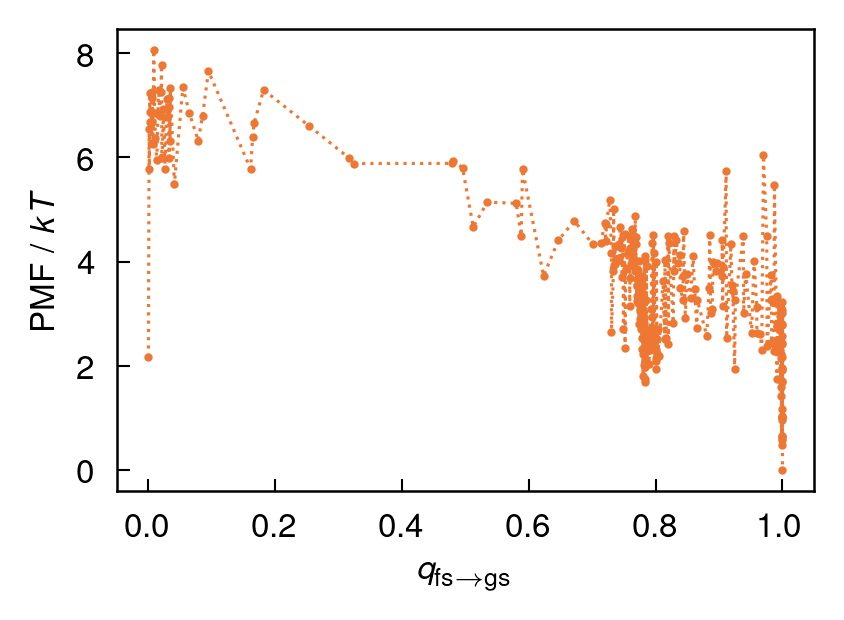

In [27]:
plt.figure(figsize=(3, 2), dpi=300)
plt.plot(q_vals, pmf, ".:")
plt.xlabel(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$")
plt.ylabel("PMF / $kT$")

# Change DGA committor lag time (all currents with 5000 frame lag)

In [29]:
q_lags = np.array([100, 200, 500, 1000, 2000, 5000], dtype=int)
j_qp, j_blue, j_green, j_orange, j_r_rmsd = [], [], [], [], []
for lag in q_lags:
    j_qp.append(np.load(f"{base_dir}/dga_data/j_fs2gs_qlag{lag}_qp.npy"))
    j_blue.append(np.load(f"{base_dir}/dga_data/j_fs2gs_qlag{lag}_blue.npy"))
    j_green.append(np.load(f"{base_dir}/dga_data/j_fs2gs_qlag{lag}_green.npy"))
    j_orange.append(np.load(f"{base_dir}/dga_data/j_fs2gs_qlag{lag}_orange.npy"))
    j_r_rmsd.append(np.load(f"{base_dir}/dga_data/j_fs2gs_qlag{lag}_r_rmsds.npy"))

/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:24: RuntimeWarning: divide by zero encountered in log
  min_energy = np.min(-np.log(hist))
/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:25: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - min_energy


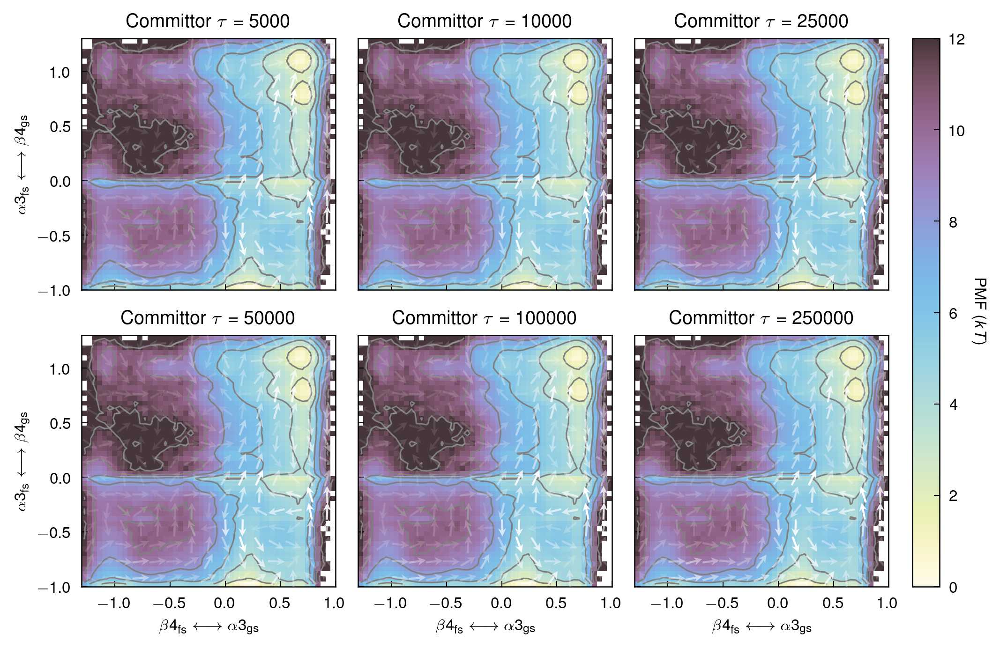

In [30]:
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(7, 4.5),
    dpi=300,
    sharex=True,
    sharey=True,
    constrained_layout=True,
)
n_current = 15
n_pmf = 50
xmin, xmax, ymin, ymax = -1.3, 1.0, -1, 1.3

lag = 5000
w_delay = [t[:-lag] for t in weights]
cv1_delay = [t[lag:] for t in c_green]
cv2_delay = [t[lag:] for t in c_blue]
clines = np.arange(0, 14, 2)
_, pmf, pc = plot_pmf(
    cv1_delay,
    cv2_delay,
    w_delay,
    xmin,
    xmax,
    ymin,
    ymax,
    n_pmf,
    clines,
    ax=axes[0, 0],
)

for ax, jx, jy, lag in zip(axes.flat, j_green, j_blue, q_lags):
    _, pmf, pc = plot_pmf(
        cv1_delay,
        cv2_delay,
        w_delay,
        xmin,
        xmax,
        ymin,
        ymax,
        n_pmf,
        clines,
        ax=ax,
        pmf=pmf,
    )
    _, quiv = plot_current(
        c_green,
        c_blue,
        jx[0],
        jy[0],
        weights,
        xmin,
        xmax,
        ymin,
        ymax,
        n_current,
        cm_j=cmapwhite,
        ax=ax,
    )
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    ax.set_title(f"Committor $\\tau$ = {lag * 50}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"PMF ($kT$)", rotation=-90, labelpad=10)

# Use same committor lag as for paper ($\tau = 100,000$)

In [28]:
j_qp = np.load(f"{base_dir}/dga_data/j_fs2gs_qp.npy")
j_blue = np.load(f"{base_dir}/dga_data/j_fs2gs_blue.npy")
j_green = np.load(f"{base_dir}/dga_data/j_fs2gs_green.npy")
j_orange = np.load(f"{base_dir}/dga_data/j_fs2gs_orange.npy")
j_r_rmsd = np.load(f"{base_dir}/dga_data/j_fs2gs_r_rmsds.npy")

/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:24: RuntimeWarning: divide by zero encountered in log
  min_energy = np.min(-np.log(hist))
/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:25: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - min_energy


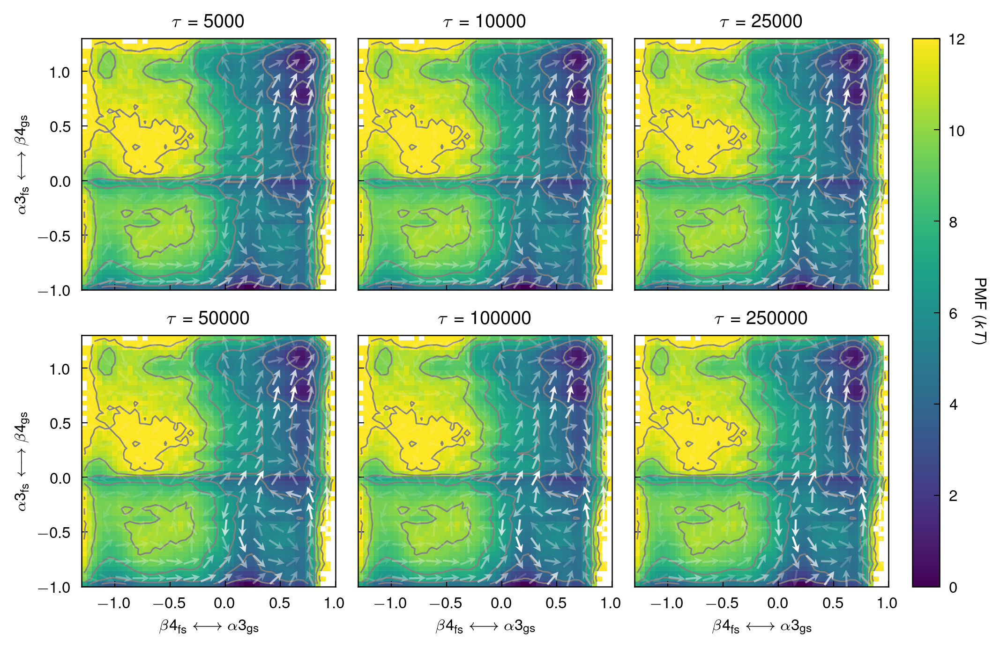

In [32]:
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(7, 4.5),
    dpi=300,
    sharex=True,
    sharey=True,
    constrained_layout=True,
)
n_current = 15
n_pmf = 50
xmin, xmax, ymin, ymax = -1.3, 1.0, -1, 1.3

lag = 5000
w_delay = [t[:-lag] for t in weights]
cv1_delay = [t[lag:] for t in c_green]
cv2_delay = [t[lag:] for t in c_blue]
clines = np.arange(0, 14, 2)
_, pmf, pc = plot_pmf(
    cv1_delay,
    cv2_delay,
    w_delay,
    xmin,
    xmax,
    ymin,
    ymax,
    n_pmf,
    clines,
    cm="viridis",
    ax=axes[0, 0],
)

for ax, jx, jy, lag in zip(axes.flat, j_green, j_blue, current_lags):
    _, pmf, pc = plot_pmf(
        cv1_delay,
        cv2_delay,
        w_delay,
        xmin,
        xmax,
        ymin,
        ymax,
        n_pmf,
        clines,
        cm="viridis",
        ax=ax,
        pmf=pmf,
    )
    _, quiv = plot_current(
        c_green,
        c_blue,
        jx,
        jy,
        weights,
        xmin,
        xmax,
        ymin,
        ymax,
        n_current,
        cm_j=cmapwhite,
        ax=ax,
    )
    ax.set_ylabel(r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$")
    ax.set_xlabel(r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$")
    ax.set_title(f"$\\tau$ = {lag * 50}")
    ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"PMF ($kT$)", rotation=-90, labelpad=10)

In [29]:
names = ["blue", "green", "orange", "r_rmsd", "qp"]
cvs = dict(blue=c_blue, green=c_green, orange=c_orange, r_rmsd=r_rmsds, qp=qp_fs2gs[4])
js = dict(blue=j_blue[4], green=j_green[4], orange=j_orange[4], r_rmsd=j_r_rmsd[4], qp=j_qp[4])
labels = dict(
    blue=r"$\alpha3_{\mathrm{fs}}\longleftrightarrow \beta4_{\mathrm{gs}}$",
    green=r"$\beta4_{\mathrm{fs}}\longleftrightarrow\alpha3_{\mathrm{gs}}$",
    orange=r"$\beta3_{\mathrm{fs}}\longleftrightarrow\alpha2_{\mathrm{gs}}$",
    r_rmsd="core RMSD (nm)",
    qp=r"$q_+$",
)
lims = dict(blue=(-1, 1.3), green=(-1.3, 1), orange=(-1.3, 1), r_rmsd=(0, 1.5), qp=(0, 1))

/scratch/local/jobs/8675824/ipykernel_3269691/1090023146.py:24: RuntimeWarning: divide by zero encountered in log
  min_energy = np.min(-np.log(hist))
/scratch/local/jobs/8675824/ipykernel_3269691/1090023146.py:25: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - min_energy


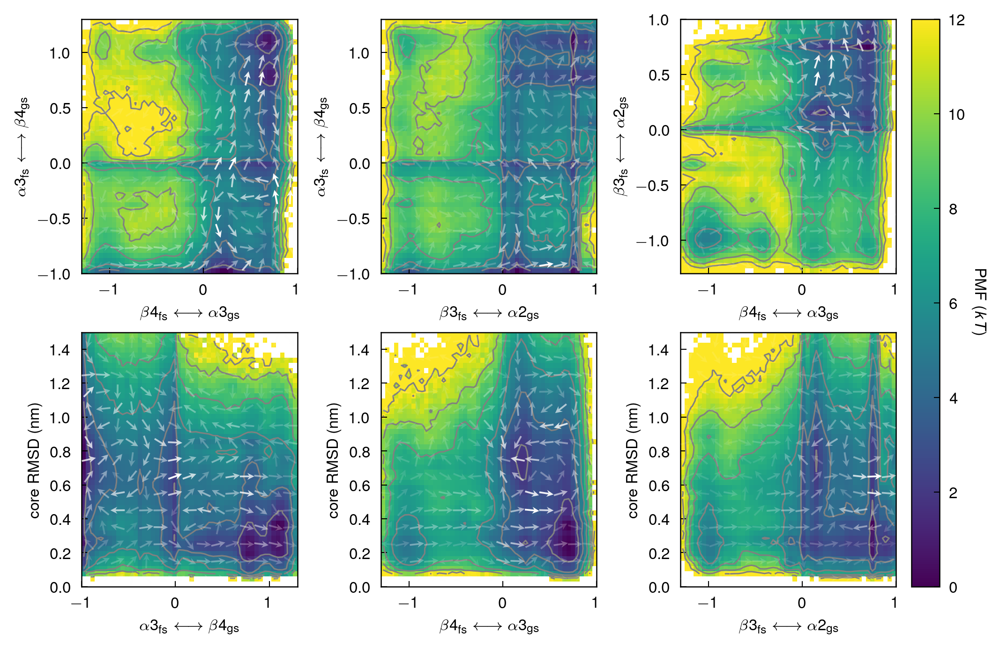

In [30]:
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(7, 4.5),
    dpi=300,
    constrained_layout=True,
)
n_current = 15
n_pmf = 50
lag = 5000
combinations = [(1, 0), (2, 0), (1, 2), (0, 3), (1, 3), (2, 3)]
w_delay = [t[:-lag] for t in weights]
clines = np.arange(0, 14, 2)

for ax, (cvi, cvj) in zip(axes.flat, combinations):
    namei = names[cvi]
    namej = names[cvj]
    cv1_delay = [t[lag:] for t in cvs[namei]]
    cv2_delay = [t[lag:] for t in cvs[namej]]

    _, pmf, pc = plot_pmf(
        cv1_delay,
        cv2_delay,
        w_delay,
        *lims[namei],
        *lims[namej],
        n_pmf,
        clines,
        cm="viridis",
        ax=ax,
    )
    _, quiv = plot_current(
        cvs[namei],
        cvs[namej],
        js[namei],
        js[namej],
        weights,
        *lims[namei],
        *lims[namej],
        n_current,
        cm_j=cmapwhite,
        ax=ax,
    )
    ax.set_xlabel(labels[namei])
    ax.set_ylabel(labels[namej])
    # ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"PMF ($kT$)", rotation=-90, labelpad=10)

# Plot density and reactive density over slices of the committor

In [31]:
def bin_inds(q, qstep=0.05, low=0, hi=1):
    q_arr = np.concatenate(q)
    nsteps = round((hi - low) / qstep)
    all_inds = []
    steps = np.linspace(low, hi - qstep, nsteps)
    for i, s in enumerate(steps):
        q_inds = ((q_arr >= s) & (q_arr <= s + qstep)).nonzero()[0]
        all_inds.append(q_inds)
    return steps, all_inds

In [32]:
steps, q_inds = bin_inds(qp_fs2gs[4], qstep=0.2)

In [33]:
print(*[len(i) for i in q_inds])

5470656 108725 264934 11380179 18612818


/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:24: RuntimeWarning: divide by zero encountered in log
  min_energy = np.min(-np.log(hist))
/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:25: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - min_energy


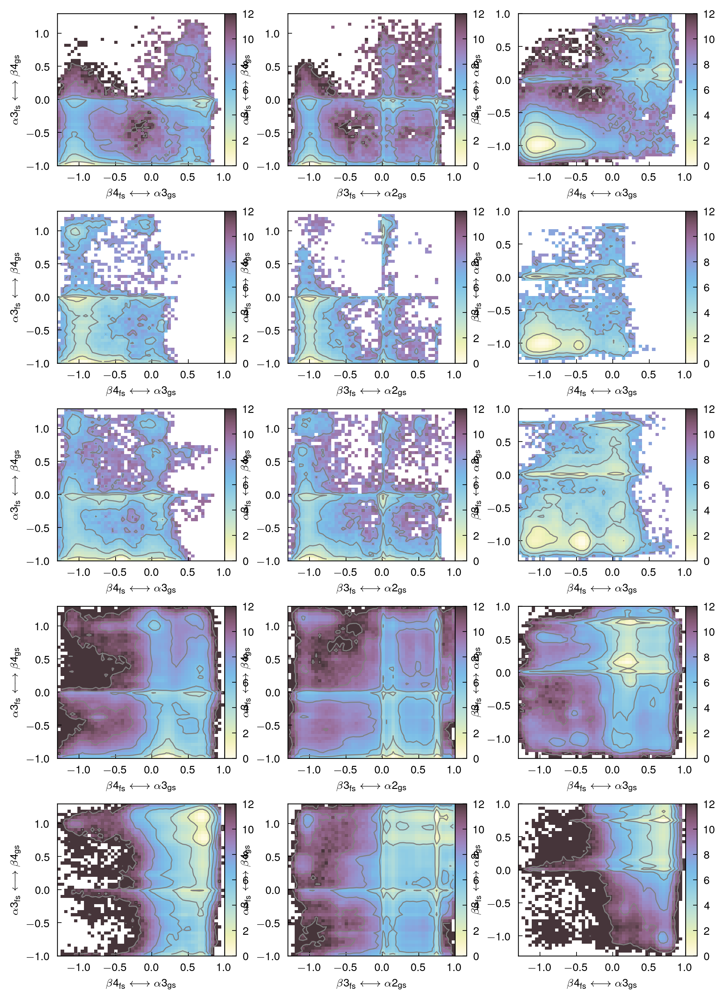

In [38]:
fig, axes = plt.subplots(
    nrows=5,
    ncols=3,
    figsize=(7, 10),
    dpi=300,
    constrained_layout=True,
)
n_pmf = 50
lag = 5000
combinations = [(1, 0), (2, 0), (1, 2)]
w_delay = [t[:-lag] for t in weights]
clines = np.arange(0, 14, 2)

for i, (step, inds) in enumerate(zip(steps, q_inds)):
    for ax, (cvi, cvj) in zip(axes[i], combinations):
        namei = names[cvi]
        namej = names[cvj]
        cv1 = np.concatenate(cvs[namei])[inds]
        cv2 = np.concatenate(cvs[namej])[inds]
        w = np.concatenate(weights)[inds]
        _, pmf, pc = plot_pmf(
            [cv1],
            [cv2],
            [w],
            *lims[namei],
            *lims[namej],
            n_pmf,
            clines,
            ax=ax,
        )
        ax.set_xlabel(labels[namei])
        ax.set_ylabel(labels[namej])
        cb = pplt.colorbar(pc, ax=ax)

In [39]:
qm_fs2gs = np.load(f"{base_dir}/dga_data/qm_fs2gs.npy")

/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:24: RuntimeWarning: divide by zero encountered in log
  min_energy = np.min(-np.log(hist))
/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:25: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - min_energy


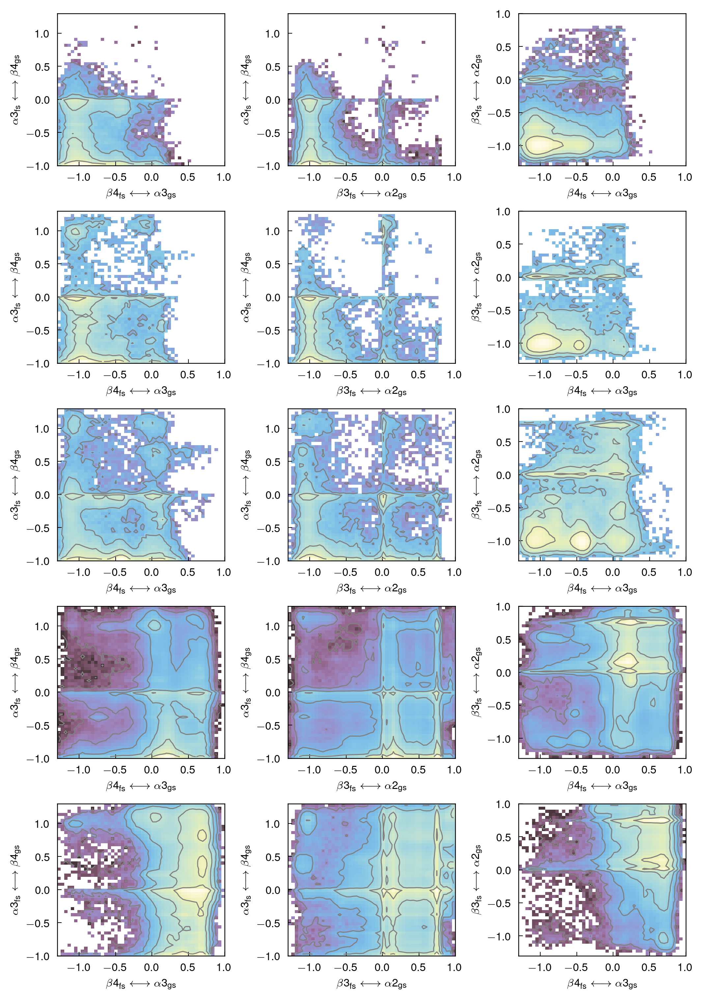

In [40]:
fig, axes = plt.subplots(
    nrows=5,
    ncols=3,
    figsize=(7, 10),
    dpi=300,
    constrained_layout=True,
)
n_pmf = 50
lag = 5000
combinations = [(1, 0), (2, 0), (1, 2)]
w_delay = [t[:-lag] for t in weights]
clines = np.arange(0, 16, 2)
w_reactive = np.concatenate(weights) * np.concatenate(qp_fs2gs[4]) * np.concatenate(qm_fs2gs[4])

for i, (step, inds) in enumerate(zip(steps, q_inds)):
    for ax, (cvi, cvj) in zip(axes[i], combinations):
        namei = names[cvi]
        namej = names[cvj]
        cv1 = np.concatenate(cvs[namei])[inds]
        cv2 = np.concatenate(cvs[namej])[inds]
        w = w_reactive[inds]
        _, pmf, pc = plot_pmf(
            [cv1],
            [cv2],
            [w],
            *lims[namei],
            *lims[namej],
            n_pmf,
            clines,
            ax=ax,
        )
        ax.set_xlabel(labels[namei])
        ax.set_ylabel(labels[namej])
        # cb = pplt.colorbar(pc, ax=ax)

# Plot 3d projections

In [34]:
qp_arr = np.concatenate(qp_fs2gs[4])
N = len(qp_arr)
skip = 400
sc_ind = np.random.choice(N, N // skip)

In [35]:
def adjust_forward_committor(forward_q, in_domain, lag):
    result_qp = []
    for qp, d in zip(forward_q, in_domain):
        n = len(d)
        assert len(qp) == n
        tp = extq.stop.forward_stop(d)
        iy = np.minimum(np.arange(lag, n), tp[:-lag])
        result_qp.append(qp[iy])
    return result_qp

In [36]:
def delay_cv(cv, lag):
    return np.concatenate([traj[:-lag] for traj in cv])

In [37]:
lag = 2000
c_green_delay = delay_cv(c_green, lag)
c_blue_delay = delay_cv(c_blue, lag)
c_orange_delay = delay_cv(c_orange, lag)
r_rmsd_delay = delay_cv(r_rmsds, lag)
qp_delay = np.concatenate(adjust_forward_committor(qp_fs2gs[4], in_d, lag))
N = len(qp_delay)
skip = 200
sc_ind = np.random.choice(N, N // skip)

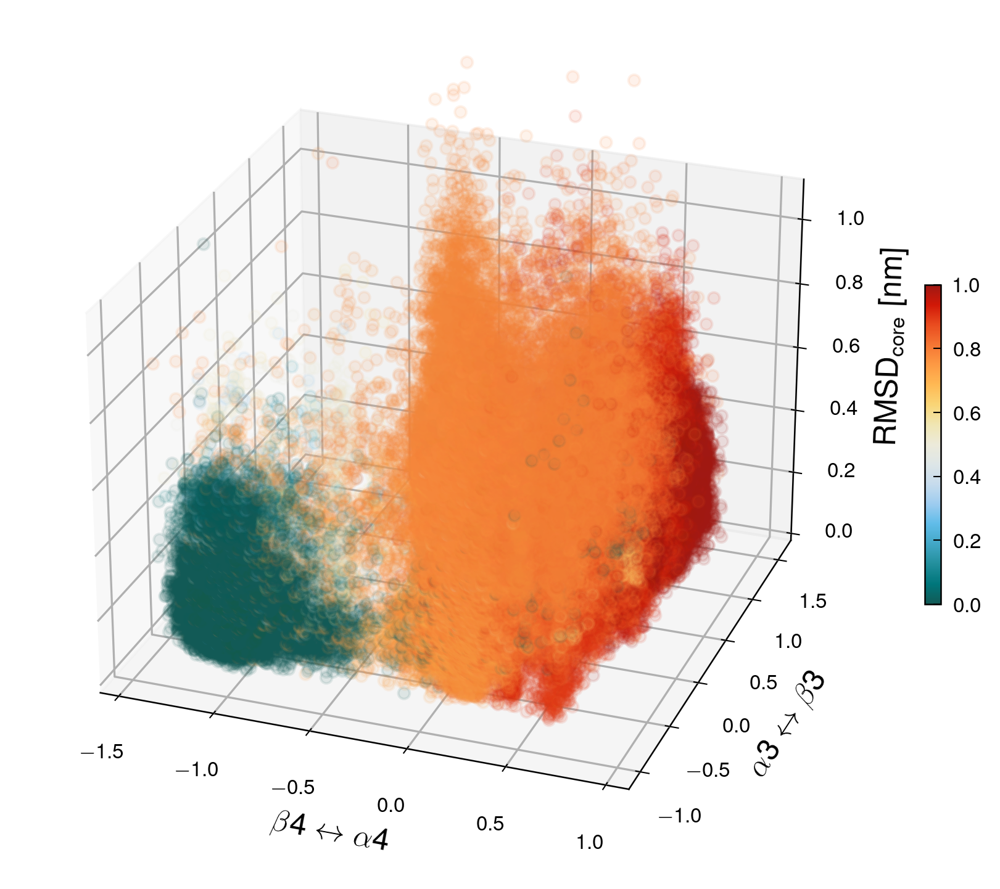

In [38]:
fig = plt.figure(figsize=(6, 6), dpi=300)
ax = fig.add_subplot(projection="3d")
sc = ax.scatter(
    c_green_delay[sc_ind],
    c_blue_delay[sc_ind],
    r_rmsd_delay[sc_ind],
    "o",
    c=qp_delay[sc_ind],
    cmap="nightfall",
    alpha=0.1,
)
ax.set_zlim([0, 2])
ax.set_xlabel(r"$\beta4\leftrightarrow \alpha4$", fontsize=12)
ax.set_ylabel(r"$\alpha3\leftrightarrow\beta3$", fontsize=12)
ax.set_zlabel(r"RMSD$_{\mathrm{core}}$ [nm]", fontsize=12)
ax.set_zlim([0, 1.1])
ax.grid(True)
cb = plt.colorbar(sc, ax=ax, shrink=0.3)
cb.solids.set(alpha=1)
ax.view_init(elev=26.0, azim=-70)
fig.tight_layout()

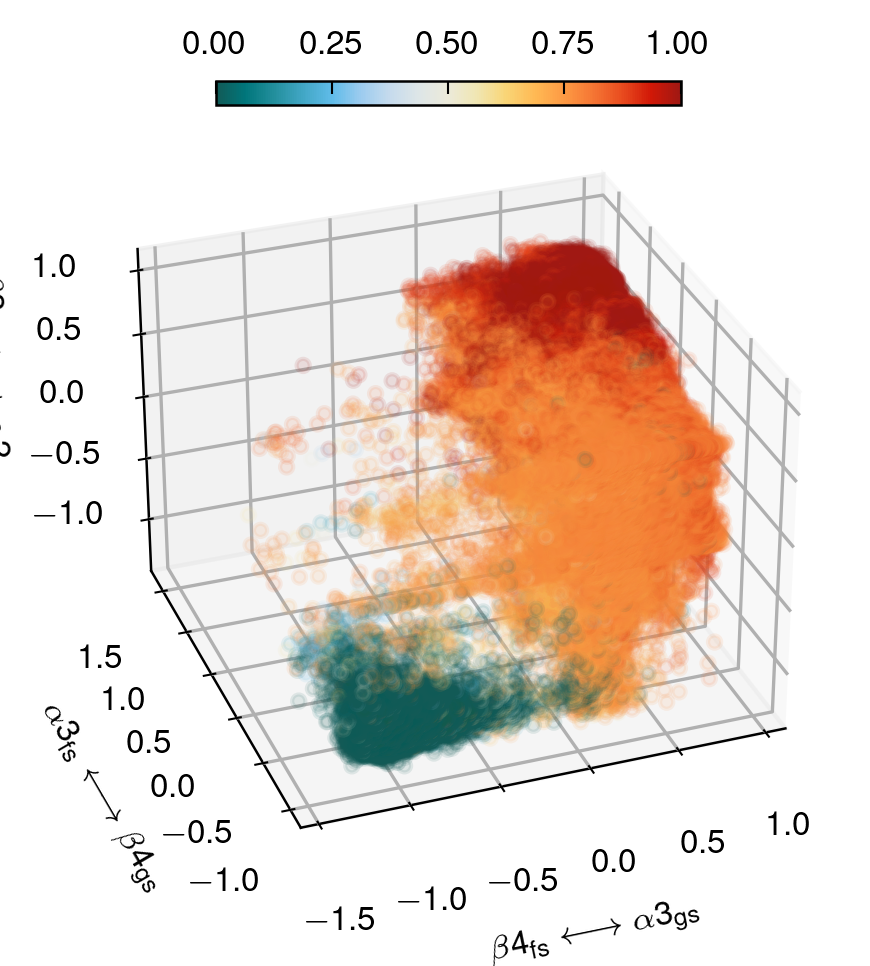

In [63]:
fig = plt.figure(figsize=(4, 4), dpi=300)
ax = fig.add_subplot(projection="3d")
sc = ax.scatter(
    c_green_delay[sc_ind],
    c_blue_delay[sc_ind],
    c_orange_delay[sc_ind],
    "o",
    c=qp_delay[sc_ind],
    cmap="nightfall",
    alpha=0.1,
    s=10,
    rasterized=True
)
ax.set_xlabel(labels["green"])
ax.set_ylabel(labels["blue"])
ax.set_zlabel(labels["orange"])
ax.grid(True)
cb = plt.colorbar(sc, ax=ax, shrink=0.5, location='top', pad=0, label=r"$q_{fs\rightarrow gs}$")
cb.solids.set(alpha=1)
ax.view_init(elev=30, azim=-110)
plt.savefig("../../dga/figures/t87_cvs_qp.png", dpi=500, bbox_inches='tight', pad_inches=1)

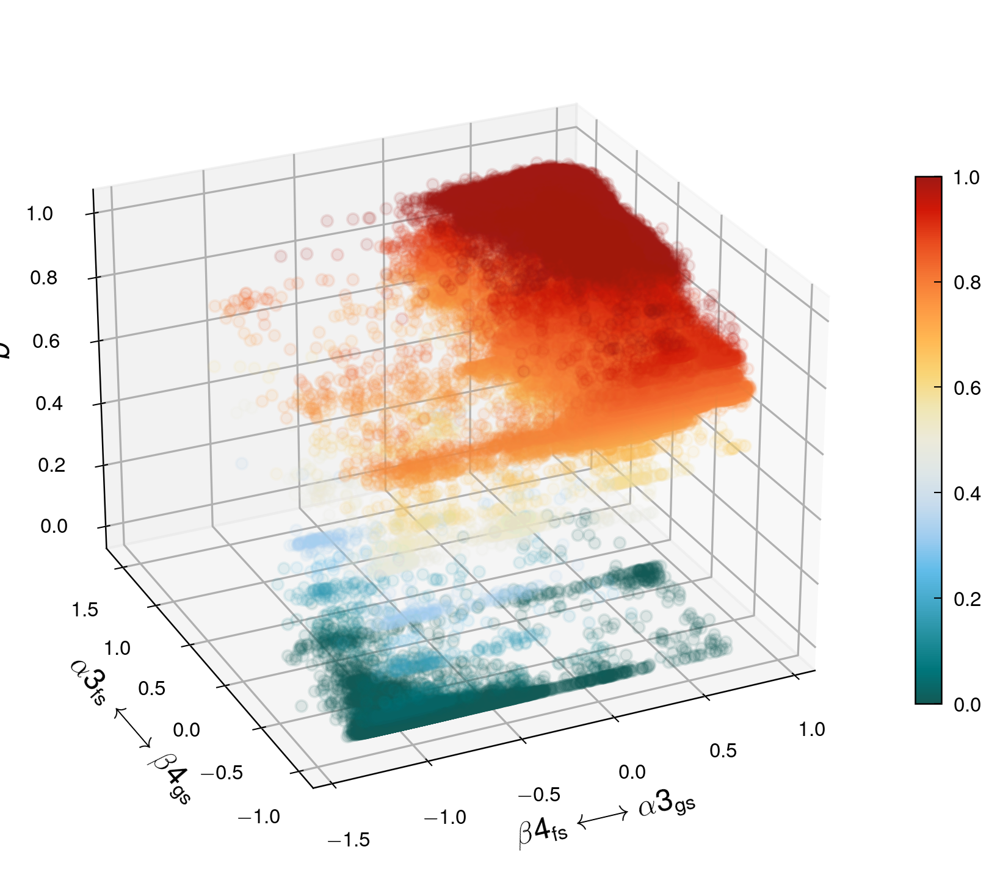

In [40]:
fig = plt.figure(figsize=(6, 6), dpi=300)
ax = fig.add_subplot(projection="3d")
sc = ax.scatter(
    c_green_delay[sc_ind],
    c_blue_delay[sc_ind],
    qp_delay[sc_ind],
    "o",
    c=qp_delay[sc_ind],
    cmap="nightfall",
    alpha=0.1,
)
ax.set_xlabel(labels["green"], fontsize=12)
ax.set_ylabel(labels["blue"], fontsize=12)
ax.set_zlabel(r"$q_+$", fontsize=12)
ax.grid(True)
cb = plt.colorbar(sc, ax=ax, shrink=0.5)
cb.solids.set(alpha=1)
ax.view_init(elev=26.0, azim=-115)
fig.tight_layout()

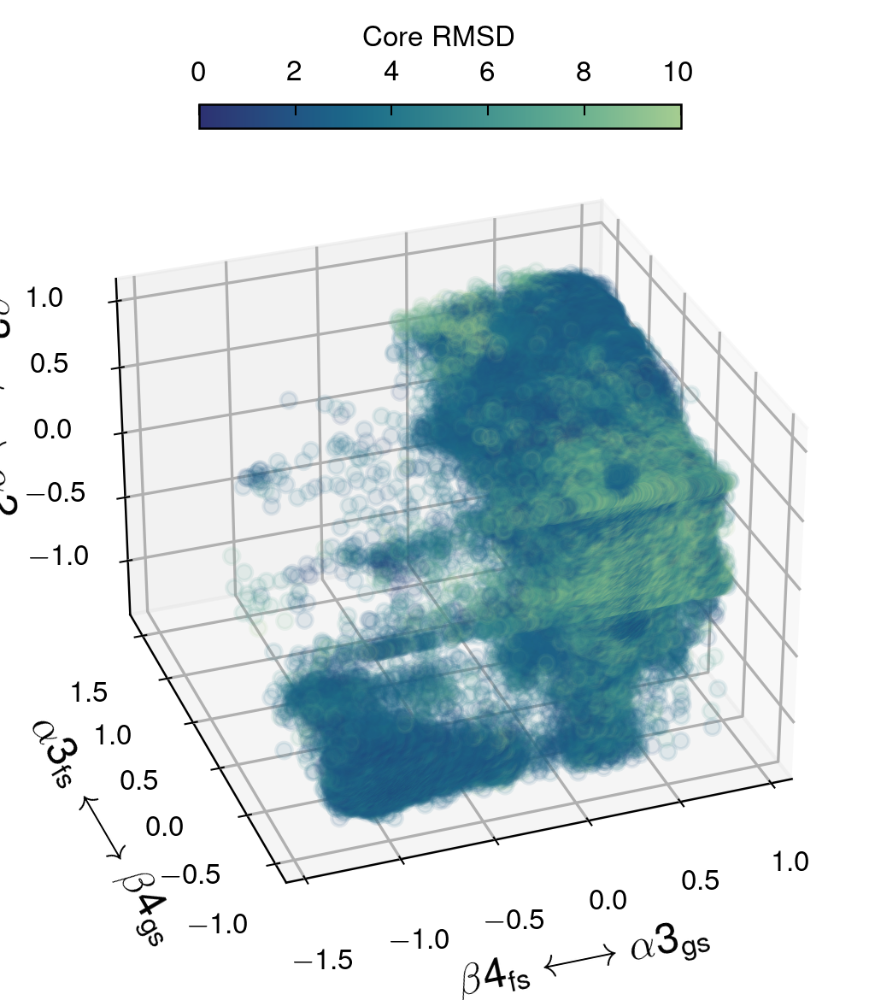

In [71]:
fig = plt.figure(figsize=(4, 4), dpi=300)
ax = fig.add_subplot(projection="3d")
sc = ax.scatter(
    c_green_delay[sc_ind],
    c_blue_delay[sc_ind],
    c_orange_delay[sc_ind],
    "o",
    c=r_rmsd_delay[sc_ind] * 10,
    cmap="crest_r",
    alpha=0.1,
    vmin=0,
    vmax=10,
)
ax.set_xlabel(labels["green"], fontsize=12)
ax.set_ylabel(labels["blue"], fontsize=12)
ax.set_zlabel(labels["orange"], fontsize=12)
ax.grid(True)
cb = plt.colorbar(sc, ax=ax, label="Core RMSD", shrink=0.5, location='top', pad=0)
cb.solids.set(alpha=1)
ax.view_init(elev=30, azim=-110)
fig.tight_layout()

# 2D slices through committor

## Binned flux

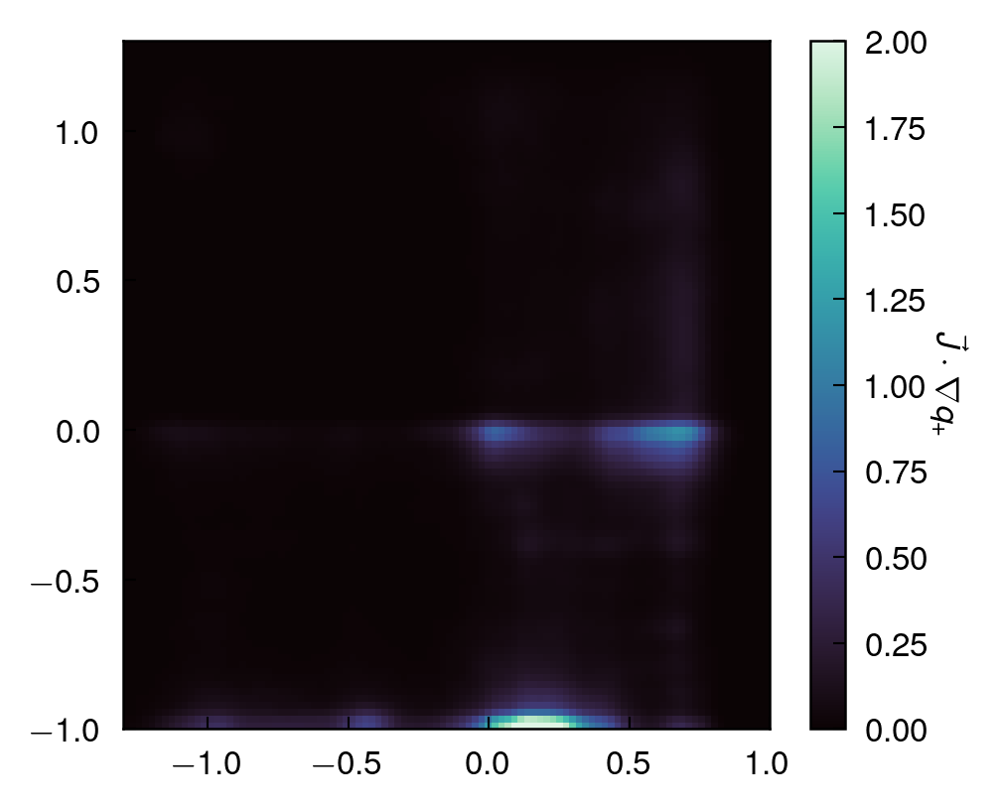

In [96]:
flux_arr = np.concatenate(js["qp"]).clip(min=0)
nx, ny = 100, 100
xstd, ystd = (xmax - xmin) / 1000, (ymax - ymin) / 1000
kde, xe, ye = kdesum2d(
    c_green_arr,
    c_blue_arr,
    flux_arr,
    xmin=lims["green"][0],
    xmax=lims["green"][1],
    ymin=lims["blue"][0],
    ymax=lims["blue"][1],
    nx=nx,
    ny=ny,
)

f = plt.figure(figsize=(3.5, 3), dpi=300)
ax = f.gca()
pc = ax.pcolor(xe, ye, kde.T * 1e7, cmap="mako", vmin=0, vmax=2)
cb = plt.colorbar(pc, ax=ax)
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)

Text(0, 0.5, '$\\beta3_{\\mathrm{fs}}\\longleftrightarrow\\alpha2_{\\mathrm{gs}}$')

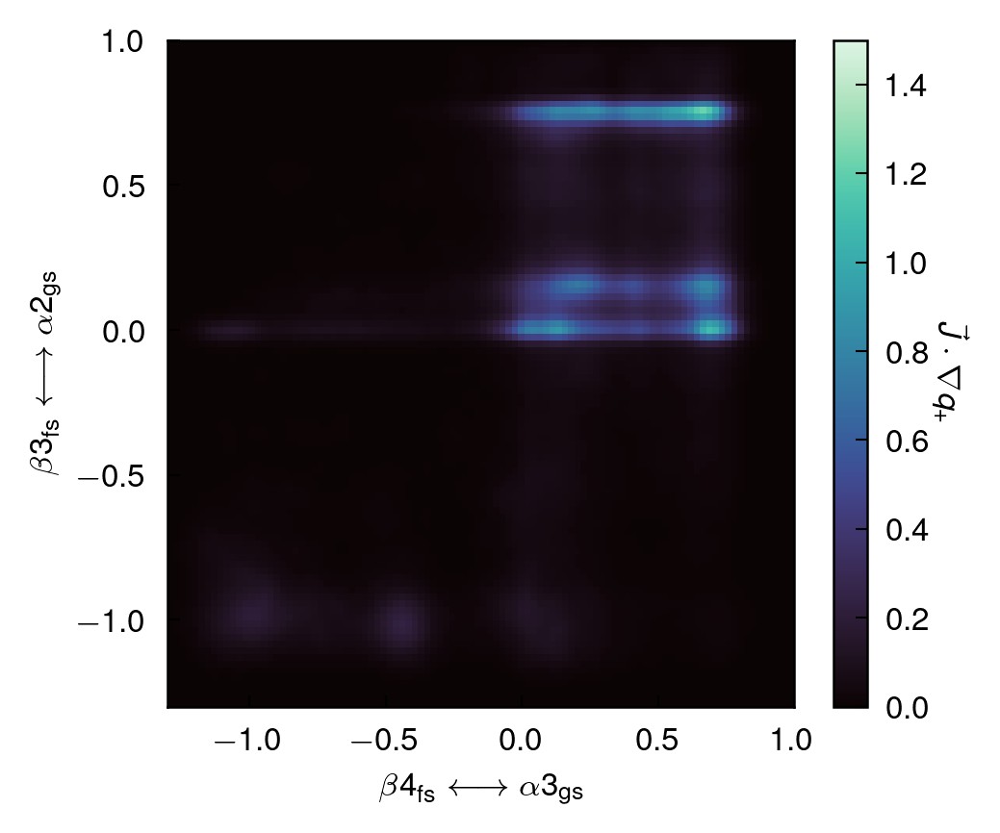

In [98]:
flux_arr = np.concatenate(js["qp"]).clip(min=0)
nx, ny = 100, 100
xstd, ystd = (xmax - xmin) / 1000, (ymax - ymin) / 1000
kde, xe, ye = kdesum2d(
    c_green_arr,
    c_orange_arr,
    flux_arr,
    xmin=lims["green"][0],
    xmax=lims["green"][1],
    ymin=lims["orange"][0],
    ymax=lims["orange"][1],
    nx=nx,
    ny=ny,
)

f = plt.figure(figsize=(3.5, 3), dpi=300)
ax = f.gca()
pc = ax.pcolor(xe, ye, kde.T * 1e7, cmap="mako", vmin=0, vmax=1.5)
cb = plt.colorbar(pc, ax=ax)
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)
ax.set_xlabel(labels["green"])
ax.set_ylabel(labels["orange"])

Text(0, 0.5, '$\\alpha3_{\\mathrm{fs}}\\longleftrightarrow \\beta4_{\\mathrm{gs}}$')

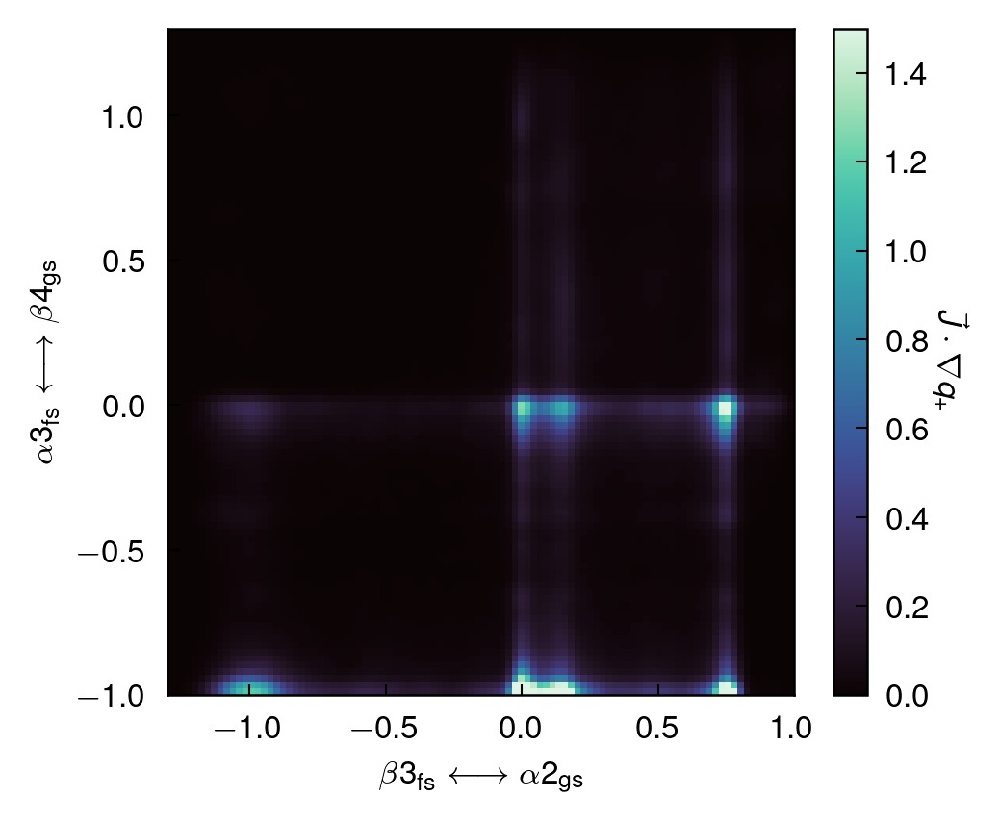

In [100]:
flux_arr = np.concatenate(js["qp"]).clip(min=0)
nx, ny = 100, 100
xstd, ystd = (xmax - xmin) / 1000, (ymax - ymin) / 1000
kde, xe, ye = kdesum2d(
    c_orange_arr,
    c_blue_arr,
    flux_arr,
    xmin=lims["orange"][0],
    xmax=lims["orange"][1],
    ymin=lims["blue"][0],
    ymax=lims["blue"][1],
    nx=nx,
    ny=ny,
)

f = plt.figure(figsize=(3.5, 3), dpi=300)
ax = f.gca()
pc = ax.pcolor(xe, ye, kde.T * 1e7, cmap="mako", vmin=0, vmax=1.5)
cb = plt.colorbar(pc, ax=ax)
cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)
ax.set_xlabel(labels["orange"])
ax.set_ylabel(labels["blue"])

## Plot by committor value

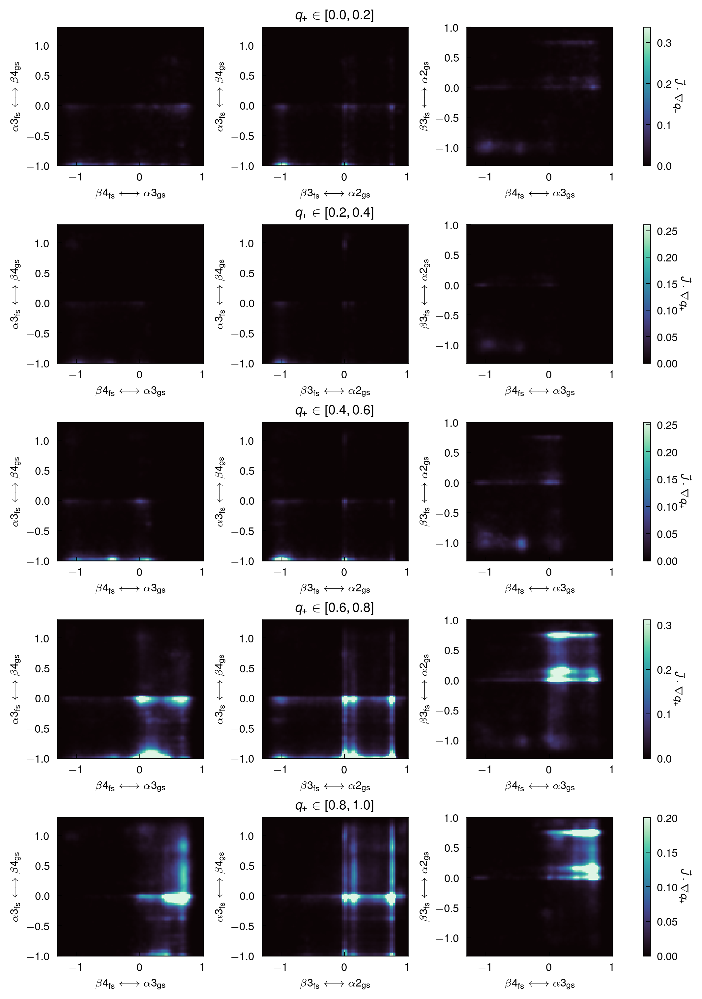

In [119]:
fig, axes = plt.subplots(nrows=5, ncols=3, dpi=300, figsize=(7, 10), constrained_layout=True)
combinations = [(1, 0), (2, 0), (1, 2)]
w_delay = [t[:-lag] for t in weights]
nx, ny = 100, 100

for row, (step, inds) in enumerate(zip(steps, q_inds)):
    for col, (ax, (cvi, cvj)) in enumerate(zip(axes[row], combinations)):
        namei = names[cvi]
        namej = names[cvj]
        cv1 = np.concatenate(cvs[namei])[inds]
        cv2 = np.concatenate(cvs[namej])[inds]
        flux = flux_arr[inds] * 1e7
        kde, xe, ye = kdesum2d(
            cv1,
            cv2,
            flux,
            xmin=lims[namei][0],
            xmax=lims[namei][1],
            ymin=lims[namej][0],
            ymax=lims[namej][1],
            nx=nx,
            ny=ny,
        )
        pc = ax.pcolor(xe, ye, kde.T, cmap="mako", vmin=0, vmax=np.max(flux) * 10)
        ax.set_xlabel(labels[namei])
        ax.set_ylabel(labels[namej])
    cb = plt.colorbar(pc, ax=axes[row])
    cb.set_label("$\\vec{J} \cdot \\nabla q_+$", rotation=-90, labelpad=10)
    axes[row, 1].set_title(f"$q_+\\in [{step:.1f}, {step+0.2:.1f}]$")

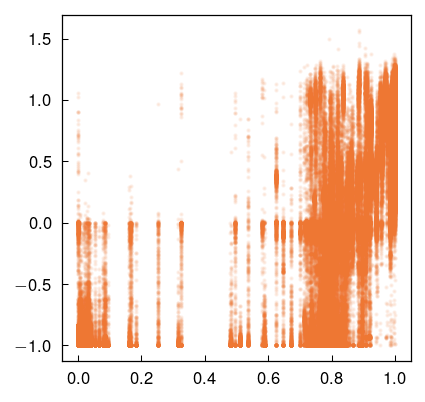

In [121]:
plt.plot(qp_arr[::100], c_blue_arr[::100], '.', alpha=0.1)

In [122]:
def adjust_forward_committor(forward_q, in_domain, lag):
    result_qp = []
    for qp, d in zip(forward_q, in_domain):
        n = len(d)
        assert len(qp) == n
        tp = extq.stop.forward_stop(d)
        iy = np.minimum(np.arange(lag, n), tp[:-lag])
        result_qp.append(qp[iy])
    return result_qp

/project/dinner/scguo/extq/src/extq/projection.py:140: RuntimeWarning: invalid value encountered in divide
  return numer / denom


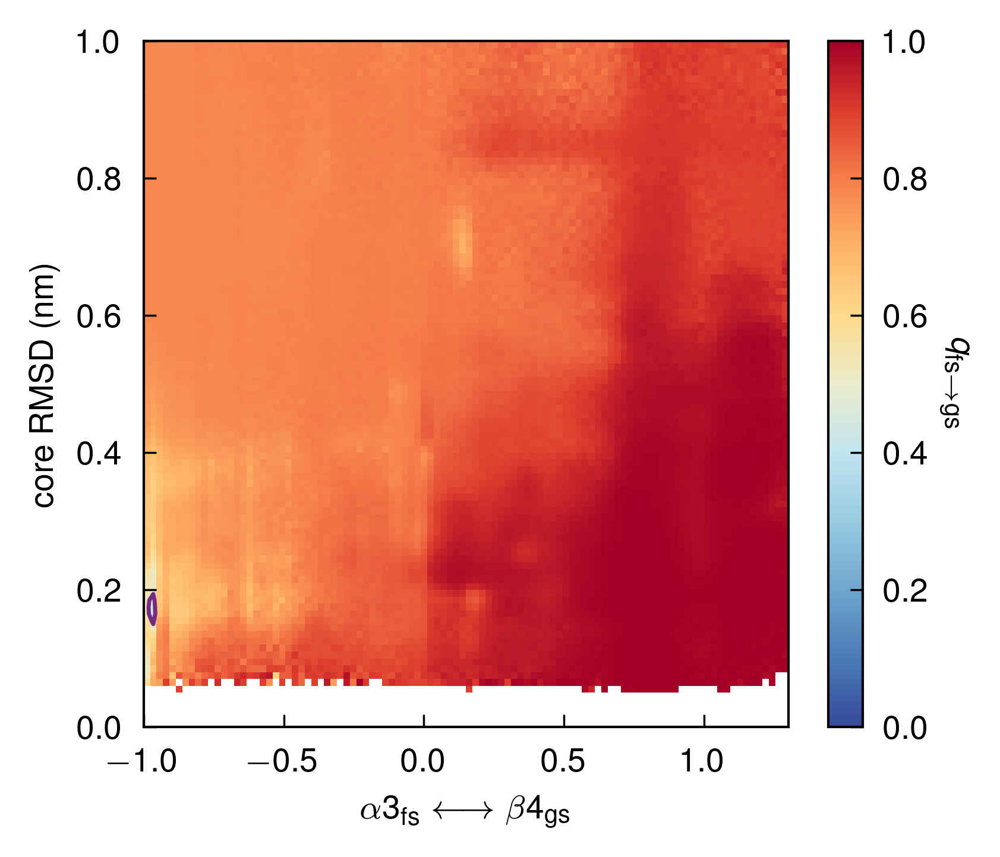

In [125]:
# plot against "BT" and "RMSD_red"
fig, ax = plt.subplots(figsize=(3.5, 3), dpi=500)

xe = np.linspace(-1, 1.3, 101)
ye = np.linspace(0, 1.0, 101)
xc = (xe[1:] + xe[:-1]) / 2
yc = (ye[1:] + ye[:-1]) / 2

w_delay = [t[:-lag] for t in weights]
cv1_delay = [t[:-lag] for t in c_blue]
cv2_delay = [t[:-lag] for t in r_rmsds]
qp_delay = adjust_forward_committor(qp_fs2gs[4], in_d, lag)
hist = extq.projection.average2d(cv1_delay, cv2_delay, qp_delay, w_delay, xe, ye)
pc = ax.pcolormesh(xc, yc, hist.T, cmap="sunset", vmin=0, vmax=1, rasterized=True)
ax.contour(xc, yc, hist.T, colors="#762A83", levels=[0.5], linewidths=1)
ax.set_ylabel(labels["r_rmsd"])
ax.set_xlabel(labels["blue"])
ax.label_outer()
cb = plt.colorbar(pc, ax=ax)
cb.set_label(r"$q_{\mathrm{fs}\rightarrow\mathrm{gs}}$", rotation=-90, labelpad=10)

# 3D KDE (following Adam)

In [49]:
nx, ny, nz = 50, 50, 20
xmin, xmax = lims["green"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 2

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["blue"],
    cvs["qp"],
    js["green"],
    js["blue"],
    js["qp"],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

3.931842973328855e-09
4.8224980336340356e-09
3.889538677847175e-09
3.206721079754664e-09
5.389453723848736e-09
6.881917600558444e-09
4.901018556047367e-09
5.260411733673165e-09
9.090250024570213e-09
9.973682005912637e-09


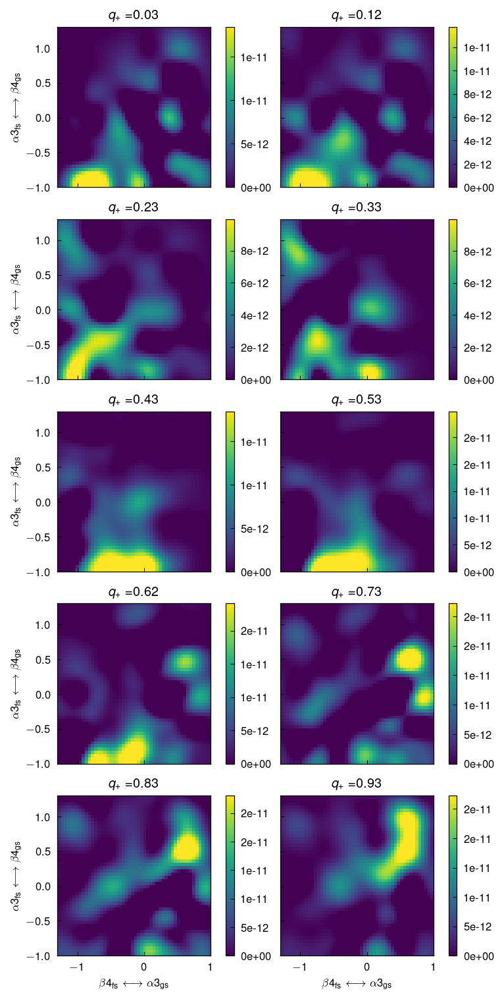

In [50]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True)
for (q, slice, ax) in zip(centerz_flux[::2], zkde.swapaxes(2, 0)[::2], axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmin=0, vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax, format="%.0e")
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    print((np.sum(slice)))

# Different committor lag time

In [45]:
js_other = dict(blue=j_blue[0], green=j_green[0], orange=j_orange[0], r_rmsd=j_r_rmsd[0], qp=j_qp[0])

/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:24: RuntimeWarning: divide by zero encountered in log
  min_energy = np.min(-np.log(hist))
/scratch/local/jobs/8675824/ipykernel_3242333/1090023146.py:25: RuntimeWarning: divide by zero encountered in log
  pmf = -np.log(hist) - min_energy


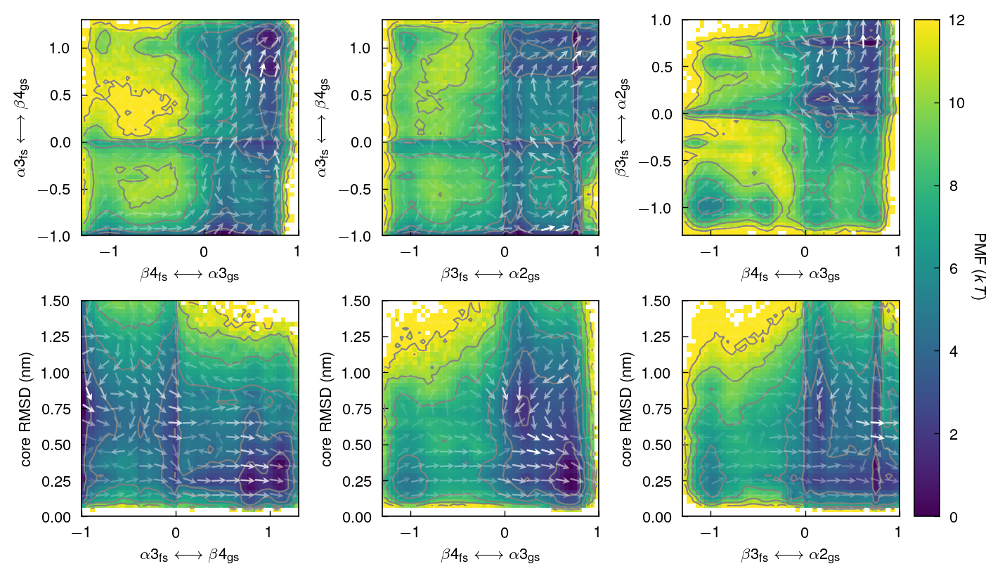

In [52]:
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(7, 4),
    dpi=200,
    constrained_layout=True,
)
n_current = 15
n_pmf = 50
lag = 5000
combinations = [(1, 0), (2, 0), (1, 2), (0, 3), (1, 3), (2, 3)]
w_delay = [t[:-lag] for t in weights]
clines = np.arange(0, 14, 2)

for ax, (cvi, cvj) in zip(axes.flat, combinations):
    namei = names[cvi]
    namej = names[cvj]
    cv1_delay = [t[lag:] for t in cvs[namei]]
    cv2_delay = [t[lag:] for t in cvs[namej]]

    _, pmf, pc = plot_pmf(
        cv1_delay,
        cv2_delay,
        w_delay,
        *lims[namei],
        *lims[namej],
        n_pmf,
        clines,
        cm="viridis",
        ax=ax,
    )
    _, quiv = plot_current(
        cvs[namei],
        cvs[namej],
        js_other[namei],
        js_other[namej],
        weights,
        *lims[namei],
        *lims[namej],
        n_current,
        cm_j=cmapwhite,
        ax=ax,
    )
    ax.set_xlabel(labels[namei])
    ax.set_ylabel(labels[namej])
    # ax.label_outer()
cb = plt.colorbar(pc, ax=axes[:, -1])
cb.set_label(r"PMF ($kT$)", rotation=-90, labelpad=10)

In [53]:
nx, ny, nz = 50, 50, 20
xmin, xmax = lims["green"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 2

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["blue"],
    cvs["qp"],
    js_other["green"],
    js_other["blue"],
    js_other["qp"],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

1.723301146970631e-08
1.715116597033932e-08
1.2264794334164038e-08
1.0181524876302757e-08
1.4022220254642733e-08
1.9778645719834288e-08
2.6159026349759274e-08
4.579403441379343e-08
7.098952571736733e-08
7.436923502790794e-08


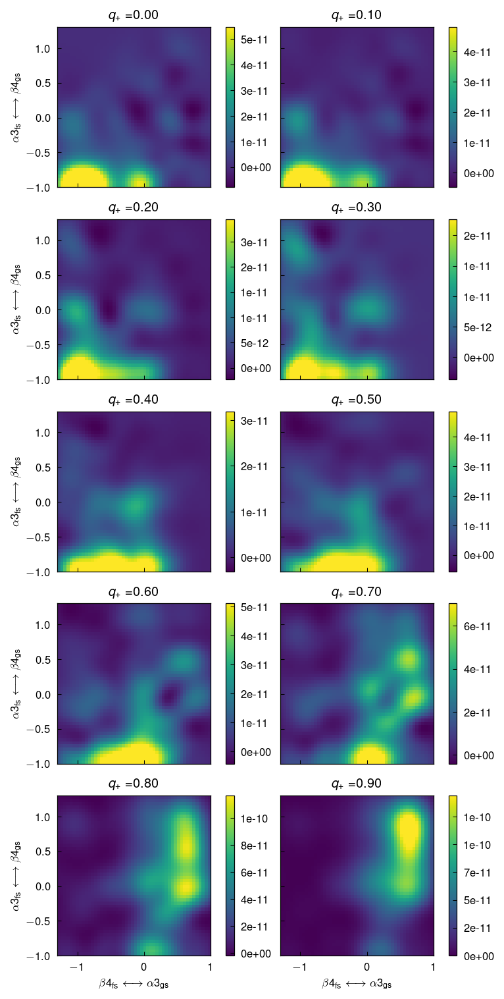

In [54]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True)
for (q, slice, ax) in zip(zlim_flux[::2], zkde.swapaxes(2, 0)[::2], axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax, format="%.0e")
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    print((np.sum(slice)))

In [55]:
nx, ny, nz = 50, 50, 20
xmin, xmax = lims["green"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 2

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["blue"],
    cvs["qp"],
    j_green[1],
    j_blue[1],
    j_qp[1],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

1.072670622007046e-08
1.1192317310786793e-08
8.068911954521457e-09
6.752007610065333e-09
1.0295753657022297e-08
1.4229842092672794e-08
1.5882716243733075e-08
2.5206236766073442e-08
4.071574964557423e-08
4.422547164625757e-08


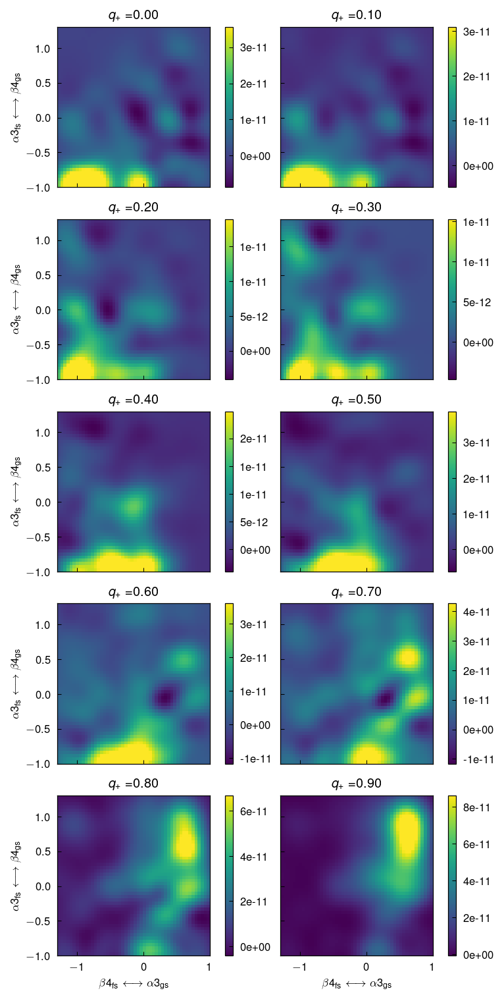

In [56]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True)
for (q, slice, ax) in zip(zlim_flux[::2], zkde.swapaxes(2, 0)[::2], axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax, format="%.0e")
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    print((np.sum(slice)))

In [57]:
nx, ny, nz = 50, 50, 20
xmin, xmax = lims["green"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 2

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["blue"],
    cvs["qp"],
    j_green[2],
    j_blue[2],
    j_qp[2],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

6.64653640608096e-09
7.086414639535418e-09
4.900532178189512e-09
4.186183587042936e-09
7.46521013245507e-09
9.991724827918885e-09
9.035119549747252e-09
1.2345376052941624e-08
2.0991934724809345e-08
2.379563954195319e-08


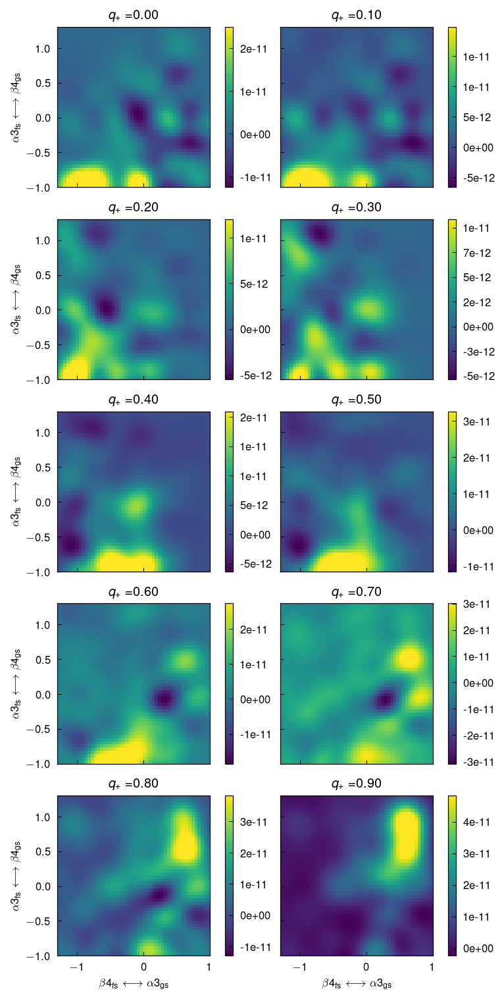

In [58]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True)
for (q, slice, ax) in zip(zlim_flux[::2], zkde.swapaxes(2, 0)[::2], axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax, format="%.0e")
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    print((np.sum(slice)))

In [59]:
nx, ny, nz = 50, 50, 20
xmin, xmax = lims["green"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 2

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["blue"],
    cvs["qp"],
    j_green[3],
    j_blue[3],
    j_qp[3],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

5.394677668815305e-09
5.88280548983474e-09
4.086297698249522e-09
3.412748702181486e-09
6.259372130575399e-09
8.056605474620172e-09
6.419242607014474e-09
8.371636585066121e-09
1.3995202226896789e-08
1.5343922717788666e-08


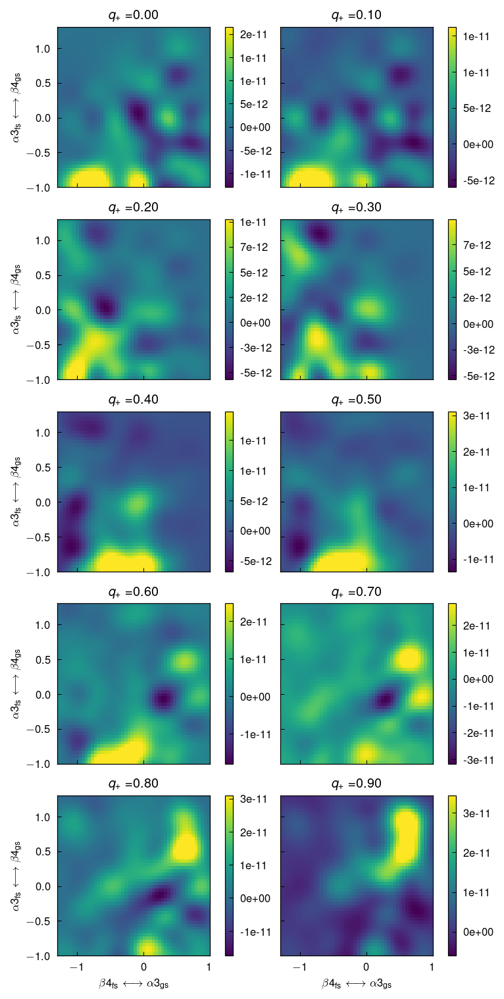

In [60]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True)
for (q, slice, ax) in zip(zlim_flux[::2], zkde.swapaxes(2, 0)[::2], axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax, format="%.0e")
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    print((np.sum(slice)))

# Other combinations of CVs

In [46]:
nx, ny, nz = 50, 50, 10
xmin, xmax = lims["green"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 1

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["blue"],
    cvs["qp"],
    js_other["green"],
    js_other["blue"],
    js_other["qp"],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

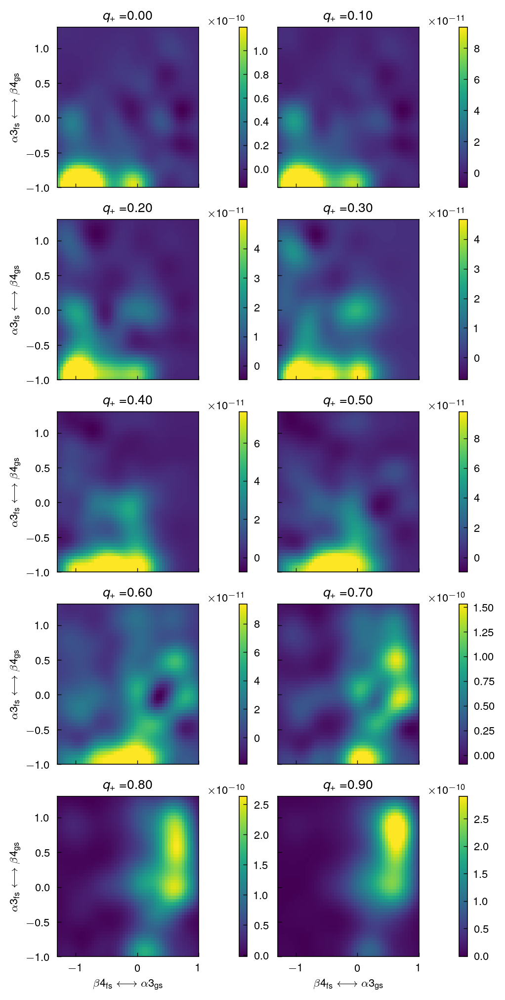

In [47]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True, dpi=200)
for (q, slice, ax) in zip(zlim_flux, zkde.swapaxes(2, 0), axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax)
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    # print((np.sum(slice)))

In [48]:
nx, ny, nz = 50, 50, 10
xmin, xmax = lims["green"]
ymin, ymax = lims["orange"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 1

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["green"],
    cvs["orange"],
    cvs["qp"],
    js_other["green"],
    js_other["orange"],
    js_other["qp"],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

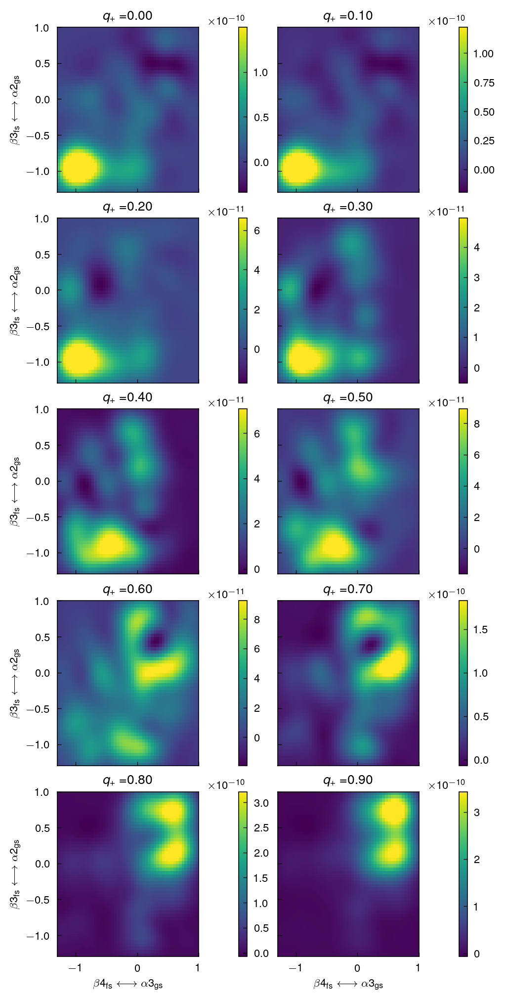

In [49]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True, dpi=200)
for (q, slice, ax) in zip(zlim_flux, zkde.swapaxes(2, 0), axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax)
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['green'])
    ax.set_ylabel(labels['orange'])
    ax.label_outer()
    # print((np.sum(slice)))

In [50]:
nx, ny, nz = 50, 50, 10
xmin, xmax = lims["orange"]
ymin, ymax = lims["blue"]
zmin, zmax = lims["qp"]

std_bins = 4

xstd = ((xmax - xmin) / nx) * std_bins
ystd = ((ymax - ymin) / ny) * std_bins
zstd = ((zmax - zmin) / nz) * 1

xlim_flux = np.linspace(xmin, xmax, nx + 1)
ylim_flux = np.linspace(ymin, ymax, ny + 1)
zlim_flux = np.linspace(zmin, zmax, nz + 1)

centerx_flux = (xlim_flux[1:] + xlim_flux[:-1]) / 2
centery_flux = (ylim_flux[1:] + ylim_flux[:-1]) / 2
centerz_flux = (zlim_flux[1:] + zlim_flux[:-1]) / 2

xkde, ykde, zkde, xe, ye, ze = kdesum3d(
    cvs["orange"],
    cvs["blue"],
    cvs["qp"],
    js_other["orange"],
    js_other["blue"],
    js_other["qp"],
    nx=nx,
    ny=ny,
    nz=nz,
    xstd=xstd,
    ystd=ystd,
    zstd=zstd,
    xmin=xmin,
    xmax=xmax,
    ymin=ymin,
    ymax=ymax,
    zmin=zmin,
    zmax=zmax,
    plot=False,
)

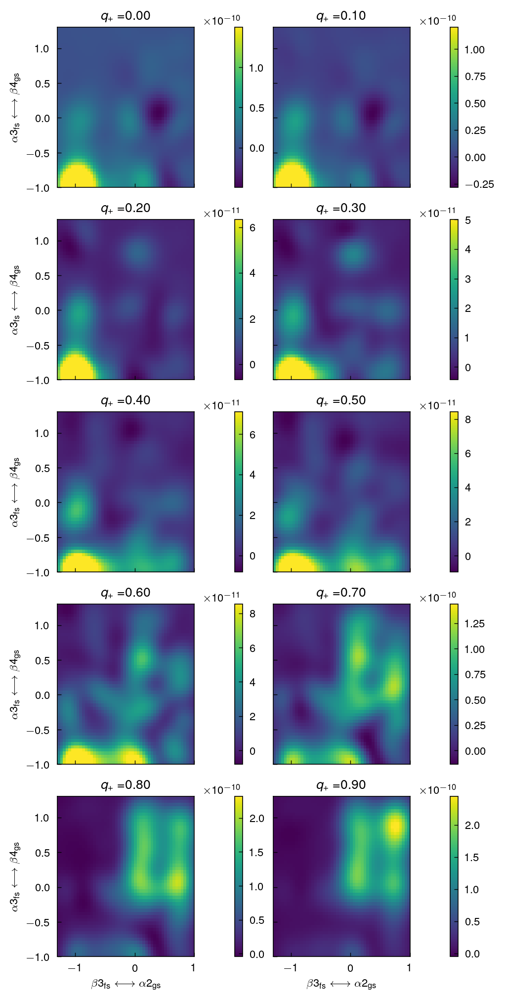

In [51]:
f, axes = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, constrained_layout=True, dpi=200)
for (q, slice, ax) in zip(zlim_flux, zkde.swapaxes(2, 0), axes.flat):
    pcm = ax.pcolormesh(
        xlim_flux, ylim_flux, slice, shading="flat", vmax=(np.mean(slice) + 3 * np.std(slice))
    )
    plt.colorbar(pcm, ax=ax)
    ax.set_title(f"$q_+ = ${q:.2f}")
    ax.set_xlabel(labels['orange'])
    ax.set_ylabel(labels['blue'])
    ax.label_outer()
    # print((np.sum(slice)))